In [61]:
!pip install -q six numpy scipy Pillow matplotlib scikit-image opencv-python imageio
!pip install -q --no-dependencies git+https://github.com/aleju/imgaug.git
!pip install -q --upgrade pip

In [0]:
import cv2
import glob
import numpy as np 
import pandas as pd 

import torch
import torchvision as tv
from torch.utils.data import Dataset, DataLoader
from tqdm.auto import tqdm
from matplotlib import pyplot as plt
from sklearn.model_selection import train_test_split

%matplotlib inline


SEED=4492
data_path = glob.glob('/content/drive/My Drive/Colab Notebooks/CV/ImagesCV/*/*.*[!txt]')

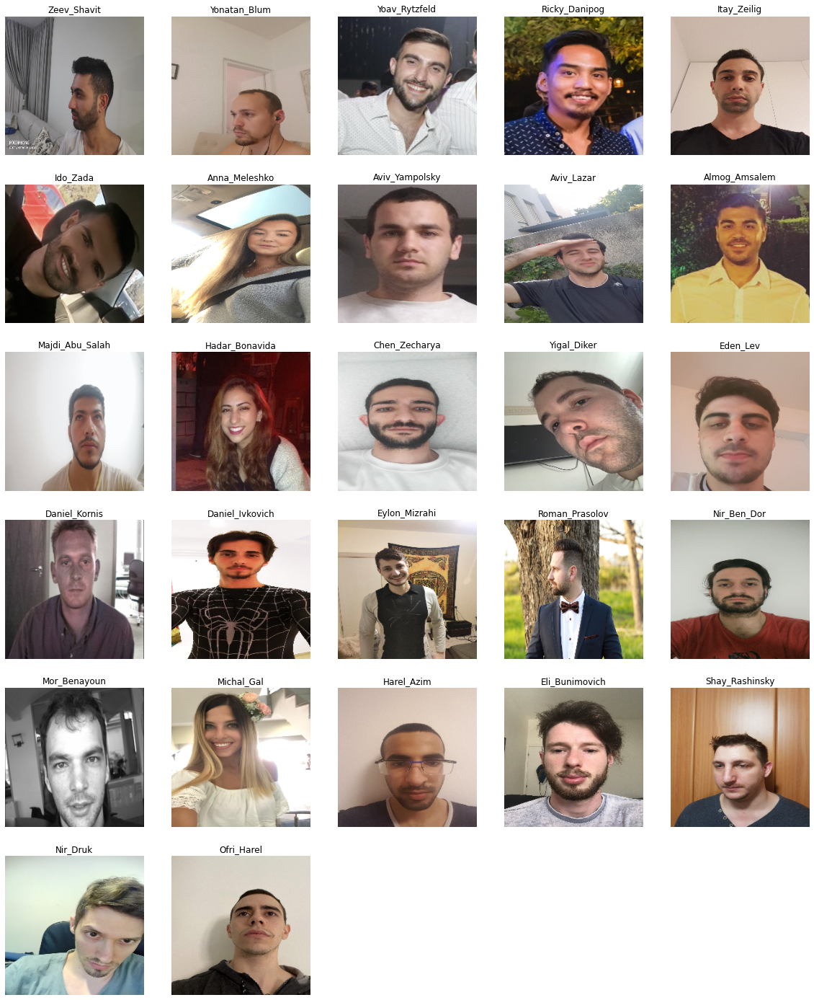

In [0]:
def get_classes(datapath, plot=True):
    row = 6
    col = 5
    names = []

    if plot:
        plt.figure(figsize=[20,25])

    for x in datapath:
        name = x.split('/')[-2]
        if name in names:
            continue
        if plot:
            plt.subplot(row,col,len(names)+1)
            
            img = cv2.imread(x)
            img = cv2.resize(img,(224,224),cv2.INTER_AREA)
            img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

            plt.imshow(img)
            plt.axis('off')
            plt.title(name)
            names.append(name)
    return names
    
        

classes = get_classes(data_path)

In [0]:

class FaceDataset(Dataset):
    def __init__(self, data, classes, size=224, transform=None, preprocess=None):
        super(FaceDataset,self).__init__()
        self.data = data
        if type(classes) == list:
            classes = np.array(classes)
        self.classes = classes
        self.size = size
        self.preprocess = preprocess
        self.transform = transform

    def __getitem__(self, idx):
        image = cv2.imread(self.data[idx], cv2.IMREAD_COLOR)
        label = self.data[idx].split('/')[-2]
        image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
        
        if self.size != None:
            image = cv2.resize(image,(self.size,self.size),cv2.INTER_AREA)

        if self.preprocess != None:
            image = self.preprocess(image)  
            
        if self.transform != None :
            image = tv.transforms.ToPILImage()(image)
            image = self.transform(image)

        label = np.where(np.array(self.classes) == label)[0][0]
        return image, label
    
    def __len__(self):
        return len(self.data)


def normalize(img):
    img -=img.min()
    img/=img.max()
    return img

# 1 - Database and Dataloader

---

# Augmentation
The direct motivation for face data augmentation is to
overcome the limitation of existing data. Insufficient data
amount or unbalanced data distribution will cause overfitting
and over-parameterization problems, leading to an obvious
decrease in the effectiveness of learning result.
Face data augmentation is fundamentally important for
improving the performance of neural networks in the following
aspects. Face data augmentation has some special
advantages, such as generating faces without self-occlusion 
and balanced dataset with more intra-class variations.
But, face data augmentation has some limitations. The generated data lack realistic variations in
appearance, such as variations in lighting, bluring, trnaforming
and sophisticated background, which means the
synthetic data domain has different distribution to real data.
Therefore some experminets needed to be done before using augmentations on the data. 
Down Below ther are some augmentations im going to use for our assingment with exaplanations and parameters limitations.

##### Augmentations selected from **imgaug** library:

https://github.com/aleju/imgaug

---



In [0]:
def get_image(data_path):
    idx = np.random.randint(len(data_path)) 
    name = data_path[idx].split('/')[-2]
    img = cv2.imread(data_path[idx])
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    img = cv2.resize(img,(512,512),cv2.INTER_AREA)
    return img,name


def plot_images(header,images,titles,row,col):
    
    plt.figure(figsize=[15,4])
    for index,(im,t) in enumerate(zip(images,titles)):
        plt.subplot(row,col,index+1)   
        plt.axis('off')
        plt.title(t)
        plt.imshow(im)
    plt.suptitle(header,size=16) 
    plt.show()

def augmentation_demo(data,aug):
    images,agumented_imgs,titles = [],[],[]

    for _ in range(5):
        img,title = get_image(data)
        images.append(img)
        img = aug(img)
        agumented_imgs.append(img)
        titles.append(title)
    plot_images('Original Images',images,titles,row=1,col=5)
    plot_images('Augmented Images',agumented_imgs,titles,row=1,col=5)
    




# #1 - Fliplr()
Horizontal flip, this transformation fits to our purpose because it doesn't damage the data.

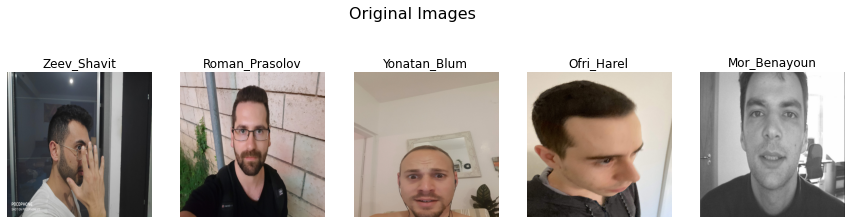

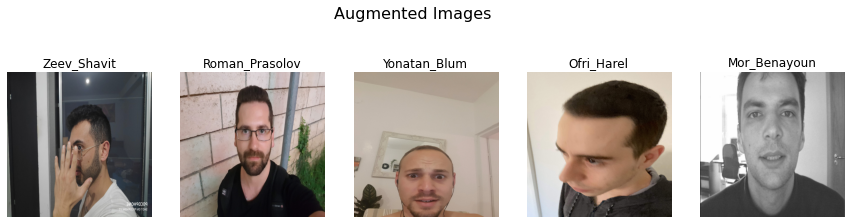

In [0]:
aug = iaa.Fliplr(1)
augmentation_demo(data_path,aug.augment_image)

# #2 - CropAndPad()
crops/pads images by defined amounts in pixels or
percent (relative to input image size).Cropping removes pixels at the sides (i.e. extracts a subimage from a given full image). Padding adds pixels to the sides (e.g. black pixels). I chose to crop by percent because it crops and pads genericly and I can have more control on it.
params that can be bad for our data are percent(x<0.3,x>0.5) becauase it may crop important content in the image



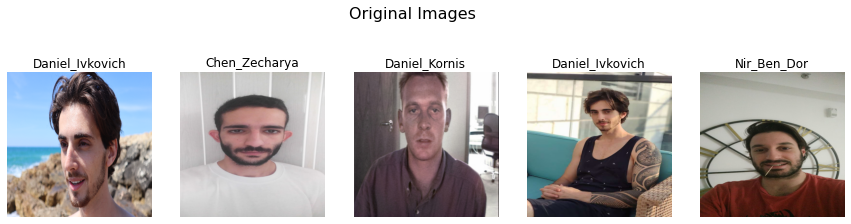

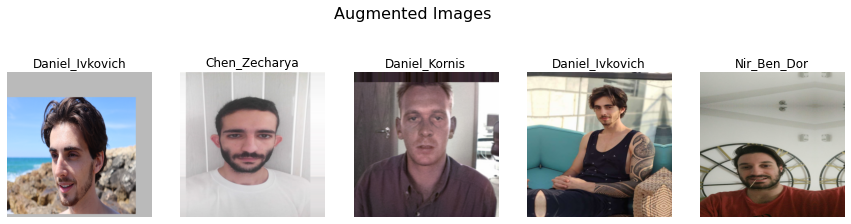

In [0]:
aug = iaa.CropAndPad(percent=(-0.1, 0.3),pad_mode=ia.ALL,pad_cval=(0, 255))
augmentation_demo(data_path,aug.augment_image)

# #3 - Affine()
apply affine transformations to images, such as rotating ,shearing and translating. on tranlastion we need to define small percentage so we wont damage the images,by giving it hit percent we may cut the face off the image.
rotation is controlled but it depends if we want to fit the model to classify
upside down images to.
for this purpose i limited the image rotation degrees to (-20,20) so the image wont be more  


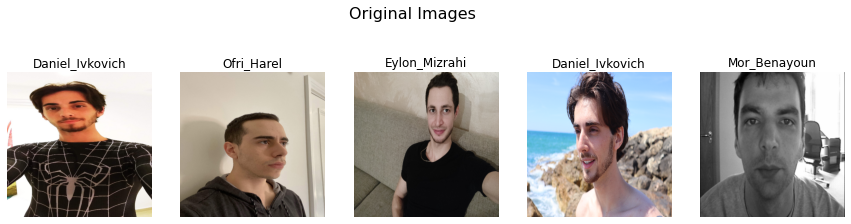

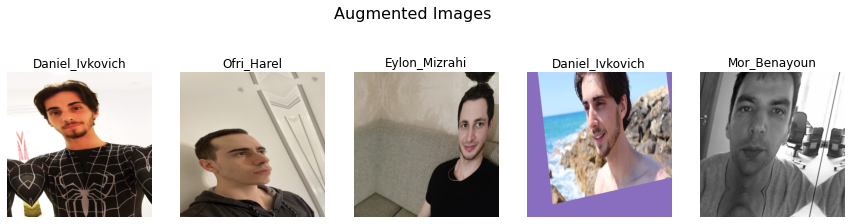

In [0]:
aug = iaa.Affine(
            scale={"x": (0.8, 1.2), "y": (0.8, 1.2)}, # scale images by percentage of their size, individually per axis
            translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)}, # translate by percentage (per axis)
            rotate=(-20, 20), # rotate by  degrees
            shear=(-20, 20), # shear by  degrees
            order=[0, 1], # use nearest neighbour or bilinear interpolation (fast)
            cval=(0, 255), # if mode is constant, use a cval between 0 and 255
            mode=ia.ALL # use any of scikit-image's warping modess)
)
augmentation_demo(data_path,aug.augment_image)

# #5 Blurs - iaa.GaussianBlur() - iaa.AverageBlur() - iaa.MedianBlur()
image Blurs - parameter k, kernel size should be controlled.

GaussianBlur - Sigma should be controlled and not to be set too high

Below: example of bad use of iaa.GaussianBlur()

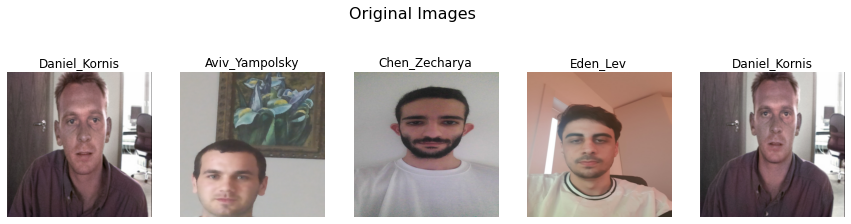

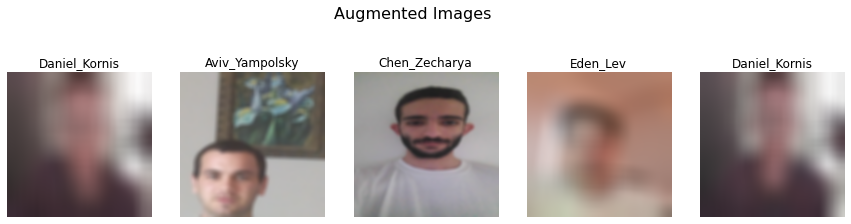

In [0]:
aug =iaa.GaussianBlur((64, 3.0)) 
augmentation_demo(data_path,aug.augment_image)

# #6 - Sharpen

Sharpens images and overlays 

alpha = visabilty of the shapness of the image. alpha is limitless.

lightness = brightness of the image. limited to 3 above that it may damage the image 

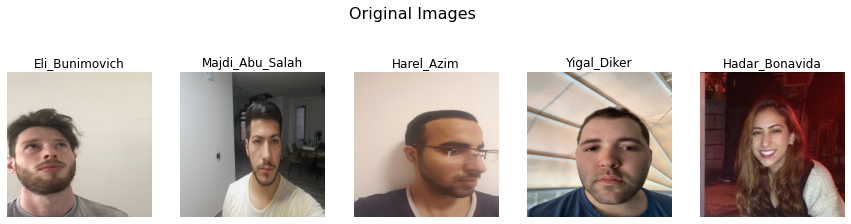

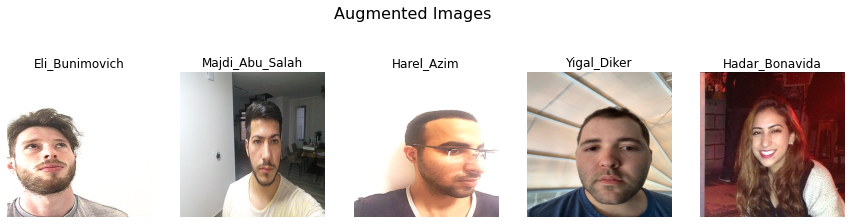

In [0]:
aug = iaa.Sharpen(alpha=(0,1), lightness=(0.75,3)) # sharpen images
augmentation_demo(data_path,aug.augment_image)

# #7 - Emboss 
Similar to sharpen, embosses images and overlays, highlights and shadows,
letting the image look as if it was recreated on a metal plate ("embossed").

Params in this augmentation are limitless.

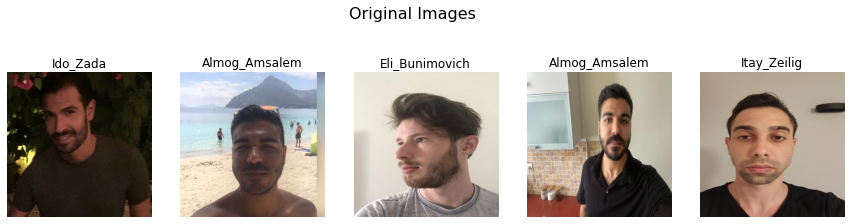

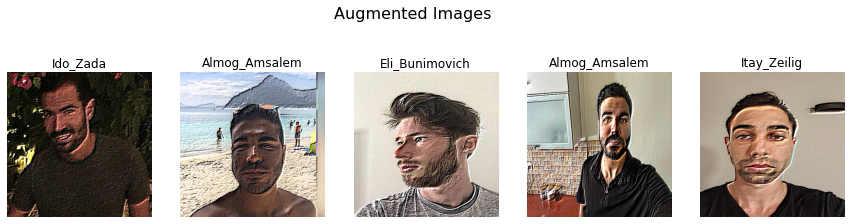

In [0]:
aug = iaa.Emboss(alpha=(1.0), strength=(2.0)) # emboss images
augmentation_demo(data_path,aug.augment_image)


# #8 Noise - AdditiveGaussianNoise, Dropout, CoarseDropout

AdditiveGaussianNoise - add gaussian noise (per channel). If scale attribute is set to a high value means that the sigma value would be high, and the noise may damage the data. I chose to limit it to 64.

Dropout - certain fraction of pixels in images to zero (per channel)

CoarseDropout - certain rectangular areas within images to zero

one both cases of the drop out we should pay attention to the **p** attribute
the propabilty of the pixel to drop. we should put a low propabilities to make sure th images wont be damaged. e.g. (0.03, 0.15) means that pixels have on of the propabilities on that range.

dropouts can make the model to classify parts of the face


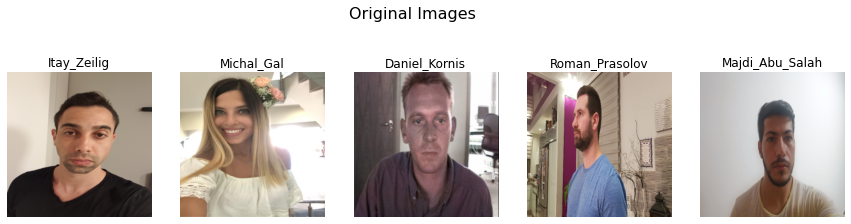

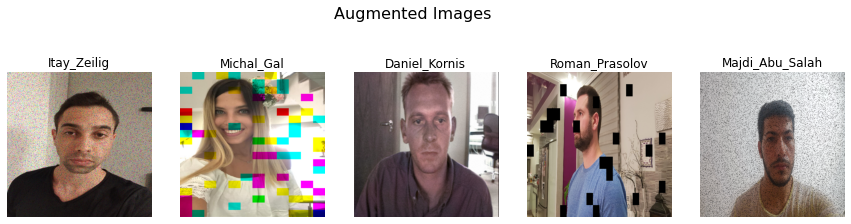

In [0]:
noise =  iaa.Sequential(iaa.OneOf([
iaa.AdditiveGaussianNoise(loc=0, scale=(0.0, 0.05*255), per_channel=0.5),
iaa.Dropout((0.01, 0.1), per_channel=0.5),
iaa.CoarseDropout((0.03, 0.1), size_percent=(0.02, 0.05), per_channel=0.2)]))
augmentation_demo(data_path,noise.augment_image)


# #9 - Add 
Add a value to all pixels in an image.In Short Random brightness.
Values should be set in range of -30 to 30. Values higher than that may damage the image.


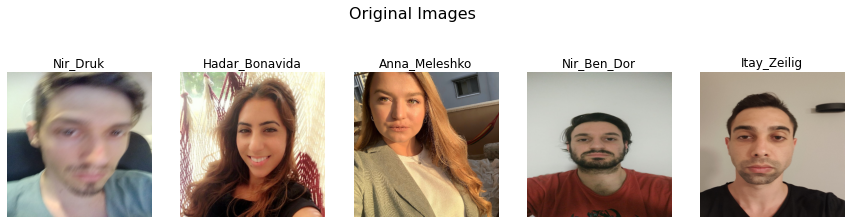

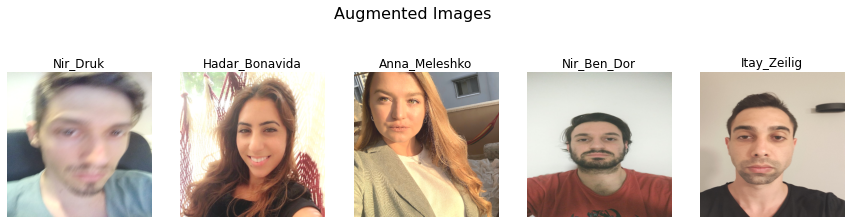

In [0]:
aug = iaa.Add(30, per_channel=0.5) # adding 30 to each pixel
augmentation_demo(data_path,aug.augment_image)

# #11 - AddToHueAndSaturation
Hue is therefore the actual color. Brightness refers to how much white (or black) is mixed in the color while Saturation indicates the amount of grey in a color.

increases/decreases hue and saturation by random values. Values are limitless

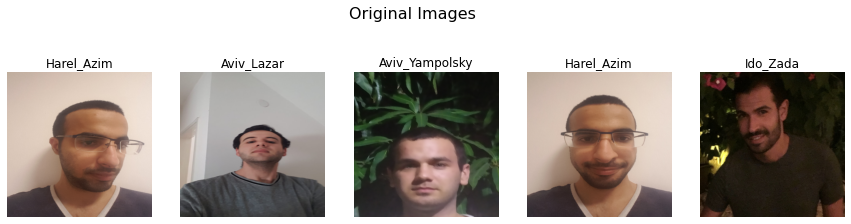

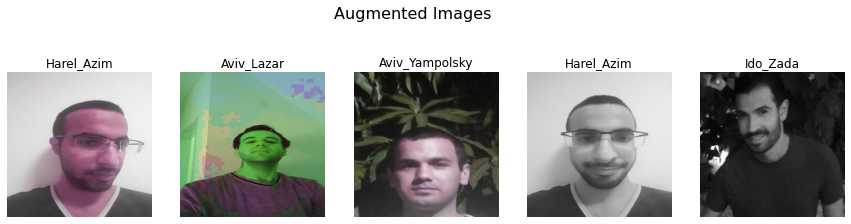

In [0]:
aug =iaa.AddToHueAndSaturation((-255, 255)) # change hue and saturation
augmentation_demo(data_path,aug.augment_image)

# #12 -Multiply 

Multiply all pixels in an image with a specific value.Can be used to make images lighter or darker. mul attribute should not be set to high value. i chose to limit it to 1.5

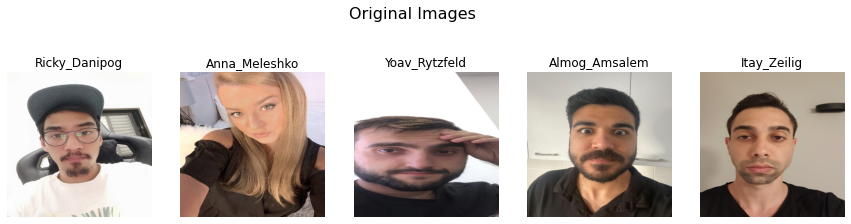

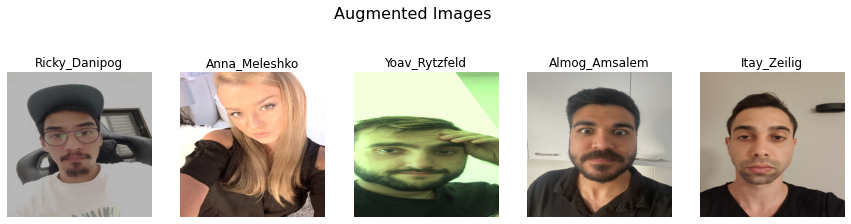

In [0]:
aug = iaa.Multiply(mul=(0.5, 1.5), per_channel=0.5)
augmentation_demo(data_path,aug.augment_image)

# #13 - LinearContrast

Adjust contrast by scaling each pixel value to ``127 + alpha*(image[i,j]-127)``
alpha valu should be setted to positive values, if negative it will inver the image colors.In addition alpha should not be higher the 2.0

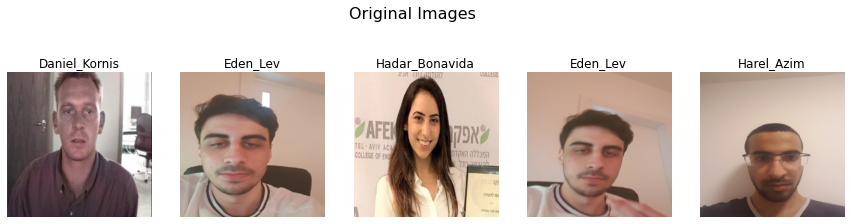

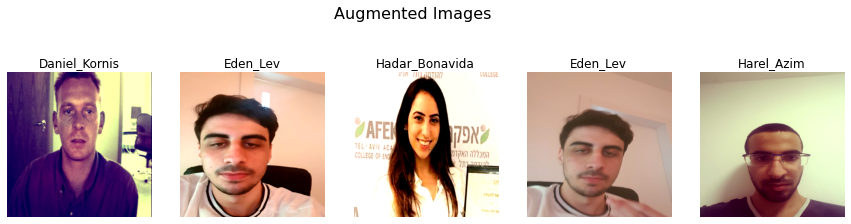

In [0]:
aug = iaa.LinearContrast(alpha=(0.5, 2.0), per_channel=0.5) # improve or worsen the contrast
augmentation_demo(data_path,aug.augment_image)

# #14 -PiecewiseAffine

places a regular grid of points on an image and randomly
moves the neighbourhood of these point around via affine transformations.
This leads to local distortions.

scale = Recommended values are in the range 0.01 to 0.03 (weak to strong augmentations).

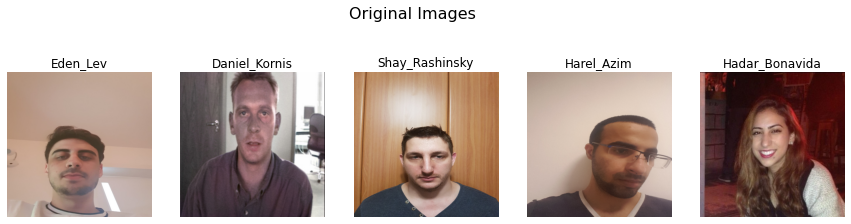

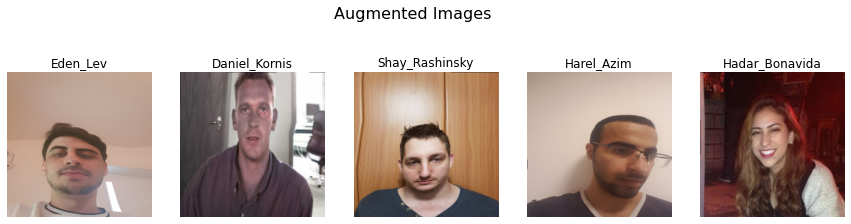

In [0]:
aug = iaa.PiecewiseAffine(scale=(0.01, 0.03)) 
augmentation_demo(data_path,aug.augment_image)

# #15 - Grayscale 

Convert images to their grayscale versions.

alpha - The alpha value of the grayscale image when overlayed over the
old image. A value close to 1.0 means, that mostly the new grayscale
image is visible. A value close to 0.0 means, that mostly the
old image is visible.

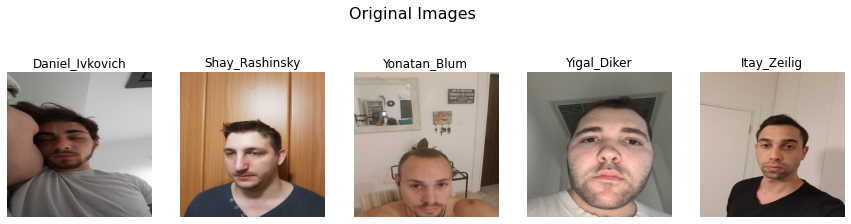

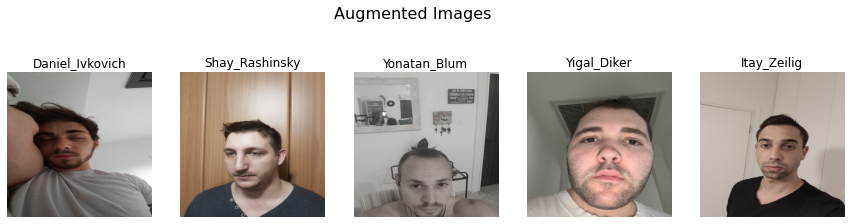

In [0]:
aug = iaa.Grayscale(alpha=(0.0, 1.0))
augmentation_demo(data_path,aug.augment_image)

# #16 - PerspectiveTransform

performs a random four point perspective transform.

Each of the four points is placed on the image using a random distance from
its respective corner. The distance is sampled from a normal distribution.
As a result, most transformations don't change very much, while some
"focus" on polygons far inside the image.

The results of this augmenter have some similarity with Crop.

scale  - params should be in range 0.01 to 0.2


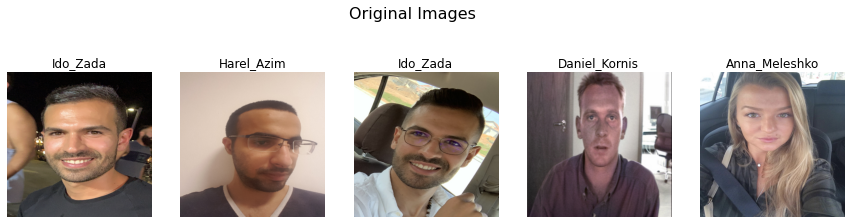

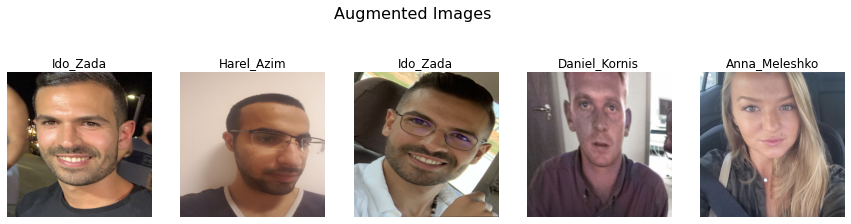

In [0]:
aug = iaa.PerspectiveTransform(scale=(0.01, 0.2))
augmentation_demo(data_path,aug.augment_image)

# Composing the augmentations

In [0]:
import imgaug as ia
import imgaug.augmenters as iaa

train_transfroms =  tv.transforms.Compose([
        tv.transforms.ToTensor(),
        tv.transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225]),
        ])

test_transfroms =  tv.transforms.Compose([
        tv.transforms.ToTensor(),
        tv.transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225]),
        ])

sometimes = lambda aug: iaa.Sometimes(0.5, aug)

seq = iaa.Sequential(
    [
        iaa.Fliplr(0.5), 
        sometimes(
            iaa.CropAndPad(percent=(-0.05, 0.1),
            pad_mode=ia.ALL,
            pad_cval=(0, 255)
        )),
        sometimes(iaa.Affine(
            scale={"x": (0.8, 1.2), "y": (0.8, 1.2)},
            translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)}, 
            rotate=(-20, 20),shear=(-10, 10),order=[0, 1],cval=(0, 255),
            mode=ia.ALL
        )),
        iaa.SomeOf((0, 5),
            [
                iaa.OneOf([
                    iaa.GaussianBlur((0, 3.0)),iaa.AverageBlur(k=(2, 7)),iaa.MedianBlur(k=(3, 7)),
                ]),
                iaa.Sharpen(alpha=(0, 1.0), lightness=(0.75, 1.5)), # sharpen images
                iaa.Emboss(alpha=(0, 1.0), strength=(0, 2.0)), # emboss images
                iaa.AdditiveGaussianNoise(loc=0, scale=(0.0, 0.05*255), per_channel=0.5), # add gaussian noise to images
                iaa.OneOf([
                    iaa.Dropout((0.01, 0.1), per_channel=0.5), # randomly remove up to 10% of the pixels
                    iaa.CoarseDropout((0.03, 0.15), size_percent=(0.02, 0.05), per_channel=0.2),
                ]),
                iaa.Add((-10, 10), per_channel=0.5), # change brightness of images (by -10 to 10 of original value)
                iaa.AddToHueAndSaturation((-20, 20)), # change hue and saturation
                iaa.OneOf([
                    iaa.Multiply((0.5, 1.5), per_channel=0.5),
                    iaa.BlendAlphaFrequencyNoise(
                        exponent=(-4, 0),
                        foreground=iaa.Multiply((0.5, 1.5), per_channel=True),
                        background=iaa.LinearContrast((0.5, 2.0))
                    )
                ]),
                iaa.LinearContrast((0.5, 2.0), per_channel=0.5), # improve or worsen the contrast
                iaa.Grayscale(alpha=(0.0, 1.0)),
                sometimes(iaa.PiecewiseAffine(scale=(0.01, 0.05))), # sometimes move parts of the image around
                sometimes(iaa.PerspectiveTransform(scale=(0.01, 0.1)))
            ],
            random_order=True
        )
    ],
    random_order=True
)

In [0]:
batch_size = 16
X_train, X_test = train_test_split(data_path,  test_size=0.2, random_state=SEED)

train_data = FaceDataset(X_train, classes, transform=train_transfroms, preprocess=seq.augment_image)
train_loader =  DataLoader(train_data, batch_size, shuffle=True, num_workers=3)

test_data = FaceDataset(X_test, classes,transform=test_transfroms)
test_loader =  DataLoader(test_data, batch_size,shuffle=True,num_workers=4)

len(train_data),len(test_data)

(443, 111)

# Combined Augmentations (on a single batch)

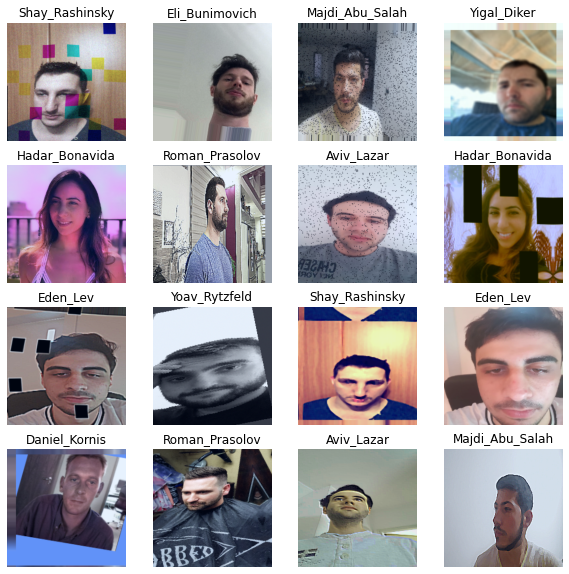

In [0]:
batch = iter(train_loader)
img,label = next(batch)
img = img.numpy()

plt.figure(figsize=[10, 10])
for i, (row, t) in enumerate(zip(img, label)):
    plt.subplot(4, 4, i+1)

    if row.shape[0] == 3:
        im = row.transpose(1, 2, 0)
    else:
        im = row.reshape((row.shape[1],row.shape[2])) 

    plt.imshow(normalize(im))
    plt.axis('off')
    plt.title(train_data.classes[t])
plt.show()


---

# Part-2 Face Swap

haarcascades - Trained classifiers for detecting objects of a particular type, e.g. faces (frontal, profile)
There are many types of this classifier, for our purpose we used haarcascade_frontalface_alt2 but there are not muche differences for this kind of assignment.

(You can uncomment the notes if you would like to use other classifiers)

---

In [0]:
# !wget https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_default.xml
# !wget https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_alt.xml
# !wget https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_alt_tree.xml
!wget https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades_cuda/haarcascade_frontalface_alt2.xml

# face_cascade = cv2.CascadeClassifier("haarcascade_frontalface_default.xml")
# face_cascade = cv2.CascadeClassifier("haarcascade_frontalface_alt.xml")
# face_cascade = cv2.CascadeClassifier("haarcascade_frontalface_alt_tree.xml")
face_cascade = cv2.CascadeClassifier("haarcascade_frontalface_alt2.xml") 

In [0]:
def detect_face(img):
    '''
        using haarcascade Classifier to detect face landmarks.
        returns a rectangle of the biggest area landmark.if face is not found 
        the function returns None
    '''
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    results = face_cascade.detectMultiScale(gray,scaleFactor=1.1,minNeighbors=5) 
    if len(results) == 0:
        return None
    areas = [w*h for x,y,w,h in results]
    return results[np.argmax(areas)]

def face_swap(img,landmark,rect):
    x,y,w,h = rect
    res = img.copy()
    temp = cv2.resize(landmark,(h,w),cv2.INTER_AREA)
    res[y:y+h,x:x+w,:] = temp
    return res

def find_valid_image():
    '''
        The cascade classifier may not always find a face on the image this 
        function makes an that we get a valid image.
    '''
    rect = None
    while rect is None:
        img = cv2.imread(data_path[np.random.randint(len(data_path))])
        img = cv2.resize(img,(1024,1024),cv2.INTER_AREA)
        rect = detect_face(img)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    return img,rect

def face_swap_demo():
    img1,face_rect1 = find_valid_image()
    img2,face_rect2 = find_valid_image()
    
    x1,y1,w1,h1 = face_rect1
    x2,y2,w2,h2 = face_rect2

    face_im1 = img1[y1:y1+h1,x1:x1+w1,:]
    face_im2 = img2[y2:y2+h2,x2:x2+w2,:]

    swp_1= face_swap(img1,face_im2,(x1,y1,w1,h1))
    swp_2 = face_swap(img2,face_im1,(x2,y2,w2,h2))
    return swp_1,swp_2


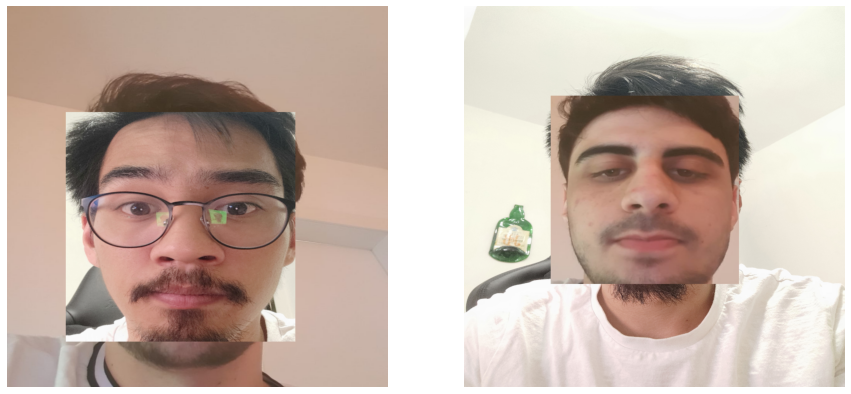

In [9]:
results = face_swap_demo()

plt.figure(figsize=[15,15])
for index,image in enumerate(results):
    plt.subplot(1,2,index+1)
    plt.axis('off')
    plt.imshow(image)
plt.show()


---
# Improvements - Facial Landmarks
As we can see the face swap isn't accurate enough therefore i will use another model to detecet face landmarks such as eyes,mouth and nose. 
The model is introduce by kurnianggoro and called LBFmodel - local binary features.


1.   The model consists on a rectangle given from the face detection of open CV
and gray image. Output of this model are points facial landmarks. With those 
points we can use OpenCV. The Points circles the landmarks and form a shape of those landmarks, with OpenCV we can use the ConvexHull method to get the Boundary shape, the outter shape of the points, the shape of the cluster.
2.   After the bounding phase we use the points to build a Delaunay Triangulation. It basically mean to build a set of connected traingles of the given points on a certain image. 
3.   The next phase is to swap each the sets of traingles of each of the two given images. Swaping the traingles includes fitting each traingle to the other corresponding triangle.
4. Building the Trinagles to fit the mask of the convexhull has created. 
5. remove the convexHull shape(the face) and replace it with the face created
on the last stages.
 
**Finaly** I use median blur to make the swaping look smoother.









Taken from:

https://github.com/kurnianggoro/GSOC2017/

---


In [0]:
!wget https://raw.githubusercontent.com/kurnianggoro/GSOC2017/master/data/lbfmodel.yaml

In [0]:
LBFmodel = "lbfmodel.yaml"

landmark_detector  = cv2.face.createFacemarkLBF()
landmark_detector.loadModel(LBFmodel)


In [0]:
def extract_index(arr):
    index = None
    for n in arr[0]:
        index = n 
        break
    return index

def get_convex_hull(landmarks):
    # extrcating the boudary shape of the points
    landmarks = np.array(landmarks, dtype=np.int32)
    return cv2.convexHull(landmarks) 

def get_landmarks_points(image, face):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    landmarks_points = []
    _, landmarks = landmark_detector.fit(gray, np.array([face]))
    for landmark in landmarks:
        for x,y in landmark[0]:
            landmarks_points.append((int(x),int(y)))
    return landmarks_points

def delaunay_triangulation(landmarks, convex_hull):
    bounding_rect = cv2.boundingRect(convex_hull)
    subdiv = cv2.Subdiv2D(bounding_rect)
    subdiv.insert(landmarks)

    delaTri = subdiv.getTriangleList() # a list that contains points of the trinagles
    indexes_triangle = [] 
    points = np.array(landmarks,dtype=np.int32)

    for triangle in delaTri:
        p1,p2,p3 = (triangle[0],triangle[1]),(triangle[2],triangle[3]),(triangle[4],triangle[5])
    
        index_pt1 = np.where((points == p1).all(axis=1))
        index_pt1 = extract_index(index_pt1)

        index_pt2 = np.where((points == p2).all(axis=1))
        index_pt2 = extract_index(index_pt2)

        index_pt3 = np.where((points == p3).all(axis=1))
        index_pt3 = extract_index(index_pt3)

        if index_pt1 is not None and index_pt2 is not None and index_pt3 is not None:
            indexes_triangle.append([index_pt1,index_pt2,index_pt3])

    return indexes_triangle

def plot_landmarks_results(original_img, landmarks_img,polyLines,tri_image,mask):
    plt.figure(figsize=[25,10])
    plt.subplot(1,5,1)
    plt.axis("off")
    plt.imshow(original_img)
    plt.title("Original Image")
    plt.subplot(1,5,2)
    plt.axis("off")
    plt.imshow(landmarks_img)
    plt.title("Points of the Facial Landmarks")
    plt.subplot(1,5,3)
    plt.axis("off")
    plt.imshow(polyLines)
    plt.title("Convex-Hull of the Facial Landmarks")
    plt.subplot(1,5,4)
    plt.axis("off")
    plt.imshow(tri_image)
    plt.title("Dalaunay triangulation of the Facial Landmarks")
    plt.subplot(1,5,5)
    plt.axis("off")
    plt.imshow(mask)
    plt.title("Mask")
    plt.show()



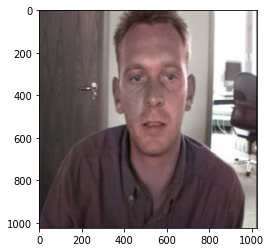

In [172]:
img, faces = find_valid_image()
plt.imshow(img);

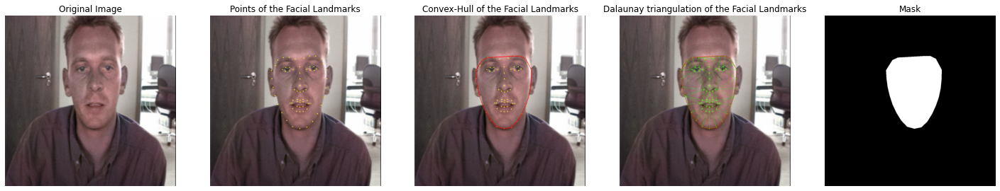

In [173]:
landmarks_img = img.copy()
landmarks = get_landmarks_points(img,faces)

# dot the image by landmarks
for x,y in landmarks:
     cv2.circle(landmarks_img, (x, y), 1, (255, 255, 0), 3)

#Get bounding polygon of the points
convex_hull = get_convex_hull(landmarks)
polyLines = cv2.polylines(landmarks_img.copy(),[convex_hull],True,(255,0,0),2)

tri_indexes = delaunay_triangulation(landmarks, convex_hull)
tri_image = polyLines.copy()

for triangle in tri_indexes:
    p1,p2,p3 = landmarks[triangle[0]], landmarks[triangle[1]], landmarks[triangle[2]]
    cv2.line(tri_image, p1, p2, (0, 255, 0), 1)
    cv2.line(tri_image, p2, p3, (0, 255, 0), 1)
    cv2.line(tri_image, p1, p3, (0, 255, 0), 1)

mask = np.zeros_like(img)
mask = cv2.fillConvexPoly(mask,convex_hull,(255,255,255))

plot_landmarks_results(img, landmarks_img,polyLines,tri_image,mask)

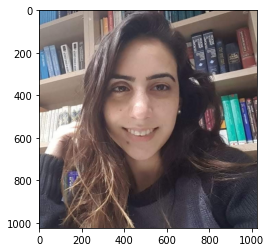

In [174]:

img2, faces2 = find_valid_image()
plt.imshow(img2);

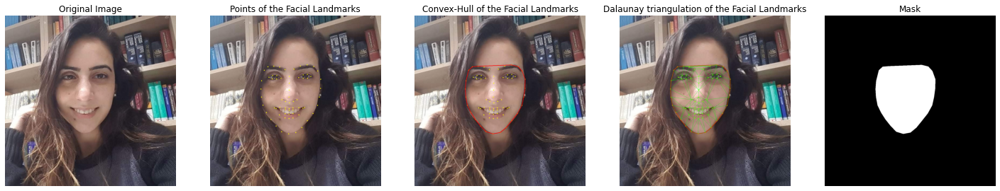

In [175]:
landmarks_img2 = img2.copy()
landmarks2 = get_landmarks_points(img2,faces2)

for x,y in landmarks2:
     cv2.circle(landmarks_img2, (x, y), 1, (255, 255, 0), 3)

convex_hull2 = get_convex_hull(landmarks2)
polyLines2 = cv2.polylines(landmarks_img2.copy(),[convex_hull2],True,(255,0,0),2)

tri_indexes2 = delaunay_triangulation(landmarks2, convex_hull2)
tri_image2 = polyLines2.copy()

for triangle in tri_indexes2:
    p1,p2,p3 = landmarks2[triangle[0]], landmarks2[triangle[1]], landmarks2[triangle[2]]
    cv2.line(tri_image2, p1, p2, (0, 255, 0), 1)
    cv2.line(tri_image2, p2, p3, (0, 255, 0), 1)
    cv2.line(tri_image2, p1, p3, (0, 255, 0), 1)
mask2 = np.zeros_like(img)
mask2 = cv2.fillConvexPoly(mask2,convex_hull2,(255,255,255))
plot_landmarks_results(img2, landmarks_img2,polyLines2,tri_image2,mask2)

---
## Plot Single Triangle 
On this part i wanted to see of one triangle correspond to the other traingle of the traingles extracted. if the triangles are matched by location we just need to fir one triangle shape to the other triangle.


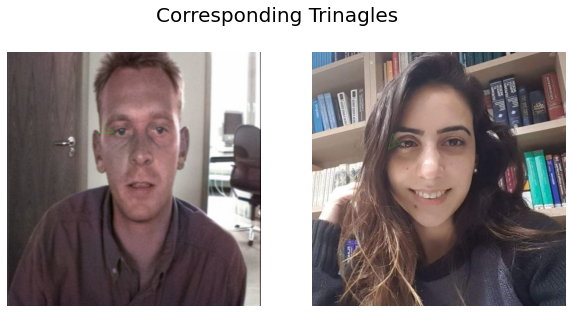

In [176]:
ex_image1 = img.copy()
ex_image2 = img2.copy()

for triangle in tri_indexes:
    p1,p2,p3 = landmarks[triangle[0]], landmarks[triangle[1]], landmarks[triangle[2]]
    cv2.line(ex_image1, p1, p2, (0, 255, 0), 1)
    cv2.line(ex_image1, p2, p3, (0, 255, 0), 1)
    cv2.line(ex_image1, p1, p3, (0, 255, 0), 1)
    p1,p2,p3 = landmarks2[triangle[0]], landmarks2[triangle[1]], landmarks2[triangle[2]]
    cv2.line(ex_image2, p1, p2, (0, 255, 0), 1)
    cv2.line(ex_image2, p2, p3, (0, 255, 0), 1)
    cv2.line(ex_image2, p1, p3, (0, 255, 0), 1)
    break

plt.figure(figsize=[10,5])
plt.subplot(1,2,1)
plt.axis("off")
plt.imshow(ex_image1)

plt.subplot(1,2,2)
plt.axis("off")
plt.imshow(ex_image2)
plt.suptitle("Corresponding Trinagles",fontsize=20)
plt.show()

In [0]:
def get_triangle_attributes(image, triangle):
    x,y,w,h = cv2.boundingRect(triangle)
    croped_part = image[y:y+h,x:x+w]
    masked_part = np.zeros((h,w), dtype=np.uint8)
    mask_points = np.array([[triangle[0][0]-x,triangle[0][1]-y],
                            [triangle[1][0]-x,triangle[1][1]-y],
                            [triangle[2][0]-x,triangle[2][1]-y]],dtype=np.int32)
    masked_part = cv2.fillConvexPoly(masked_part, mask_points, 255)
    return {'image': cv2.bitwise_and(croped_part,croped_part,mask=masked_part),# the croped triangle
            'points' : mask_points.astype(np.float32), # Traingle points in the image
            'size': (w,h),
            'rect': (x,y,w,h), # size of the croped image
            'mask' : masked_part
            }

def swap_triangles(image1,image2,landmarks1,landmarks2,tri_indexes):
    target = np.zeros_like(image2, dtype=np.uint8)

    for triangle in tri_indexes: # run through corresponding traingles  
        tr_p1,tr_p2,tr_p3 = landmarks1[triangle[0]], landmarks1[triangle[1]], landmarks1[triangle[2]]
        tr2_p1,tr2_p2,tr2_p3 = landmarks2[triangle[0]], landmarks2[triangle[1]], landmarks2[triangle[2]]

        tri_1 = np.array([tr_p1,tr_p2,tr_p3],dtype=np.int32) # Traingle1
        croped_tri = get_triangle_attributes(image1,tri_1)

        tri_2 = np.array([tr2_p1,tr2_p2,tr2_p3],dtype=np.int32) # Traingle2
        croped_tri2 = get_triangle_attributes(image2,tri_2)

        # Trasform the triangle to fit to the area and shape of the other triangle(on the other image)
        transform_mat = cv2.getAffineTransform(croped_tri['points'], croped_tri2['points'])
        trasformed_tri = cv2.warpAffine(croped_tri['image'], transform_mat, croped_tri2['size'])
        trasformed_tri = cv2.bitwise_and(trasformed_tri, trasformed_tri, mask=croped_tri2['mask'])

        #Paste Triangles side by side.
        x,y,w,h = croped_tri2['rect']
        tri_area = target[y:y+h, x:x+w] 
        tri_area_gray = cv2.cvtColor(tri_area,cv2.COLOR_RGB2GRAY)

        _, mask_traingles_designed = cv2.threshold(tri_area_gray, 1, 255, cv2.THRESH_BINARY_INV)
        trasformed_tri = cv2.bitwise_and(trasformed_tri, trasformed_tri, mask=mask_traingles_designed)
        tri_area = cv2.add(tri_area,trasformed_tri)
        target[y:y+h,x:x+w] = tri_area

    #Bluring - pasting traingles somtimes lead to unfilled pixels.
    target = cv2.medianBlur(target,3)
    return target

def inject_face(source_image, target, convex_hull):
    # Creating a mask to remove the face from the image
    gray_target = cv2.cvtColor(target,cv2.COLOR_RGB2GRAY)
    face_mask = np.zeros_like(gray_target)
    head_mask = cv2.fillConvexPoly(face_mask, convex_hull, 255)
    face_mask = cv2.bitwise_not(head_mask)

    # remove the face with ge mask created
    head_noface = cv2.bitwise_and(source_image, source_image, mask=face_mask)
    # adding the target (requested image to be inject) to the image
    result = cv2.add(head_noface, target)

    (x, y, w, h) = cv2.boundingRect(convex_hull)
    center_face = (int((x + x + w) / 2), int((y + y + h) / 2))

    return cv2.seamlessClone(result, source_image, head_mask, center_face, cv2.NORMAL_CLONE)

def face_swap_v2(image1,image1_face,image2,image2_face):
    # extract landmarks
    landmarks1 = get_landmarks_points(image1,image1_face)
    landmarks2 = get_landmarks_points(image2,image2_face)

    # extract convex hull shape
    convex_hull1 = get_convex_hull(landmarks1)
    convex_hull2 = get_convex_hull(landmarks2)

    # extract trainalges to a list
    tri_indexes1 = delaunay_triangulation(landmarks1, convex_hull1)
    tri_indexes2 = delaunay_triangulation(landmarks2, convex_hull2)

    # transform corresponding trainalges of the images 
    target1 = swap_triangles(image1,image2,landmarks1,landmarks2,tri_indexes1)
    target2 = swap_triangles(image2,image1,landmarks2,landmarks1,tri_indexes2)

    # inject faces(targets) to images
    result1 = inject_face(image2, target1, convex_hull2) #face image1 to image2
    result2 = inject_face(image1, target2, convex_hull1) #face image2 to image1
    
    result1 = cv2.medianBlur(result1,9)
    result2 = cv2.medianBlur(result2,9)
    return result1,result2




68 68


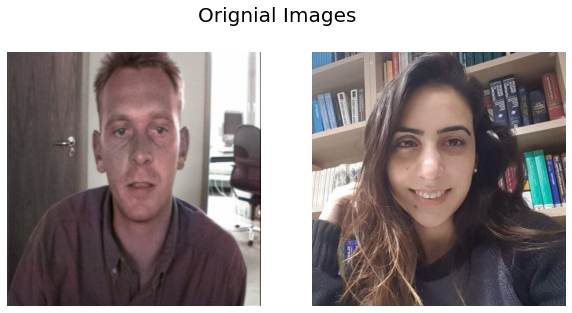

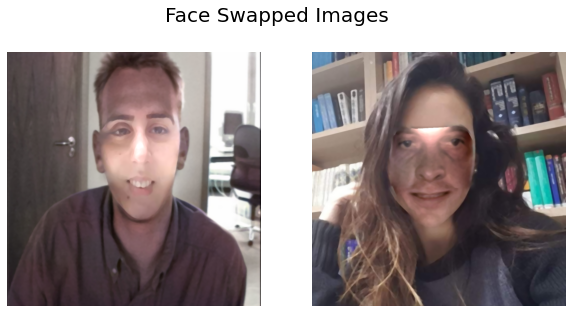

In [187]:
result1,result2 = face_swap_v2(img.copy(),faces,img2.copy(),faces2)

plt.figure(figsize=[10,5])
plt.subplot(1,2,1)
plt.axis("off")
plt.imshow(img)

plt.subplot(1,2,2)
plt.axis("off")
plt.imshow(img2)
plt.suptitle("Orignial Images",fontsize=20)
plt.show()

plt.figure(figsize=[10,5])
plt.subplot(1,2,1)
plt.axis("off")
plt.imshow(result2)

plt.subplot(1,2,2)
plt.axis("off")
plt.imshow(result1)
plt.suptitle("Face Swapped Images",fontsize=20)
plt.show()

# 3 - Summary

On this Assignment i built a dataset of student using **pytorch Database**.
The database needs to be provided with augmentations. The Augmentation I chose (explained above) are **imgaug** augmentations library. When I chose the augmentations a ran it on the some images on the data to get an idea what parameters I should use and what are the limitations.
After choosing the augmentations I created the database and dataloader, with the selected augmentations and results were good (examples of augmentations can be found at **section 1 - Database and Dataloaders**).

On **Part 2 - Face Swap** I used openCV CascadeClassifier, a face detector that provide us with a rectangle of the face.I tried to swap faces with those rectangles but the results were not accurate enough. So after scanning the web 
I found a Clssifier called LBFmodel, that provide us with face land marks such as eyes, nose etc. The process of extracting the face are described above. 
the swap is not perfect because some of the images didnt include a full face or
the CascadeClassifier found the wrong object. But on some images the swap went good.

Further Explanations on part 2:

Triangle swaping and transforming example :![alt text](https://pysource.com/wp-content/uploads/2019/05/vlcsnap-error433-1024x576.png)

after the transformation we "paste" the transformed triangle on the other image mask. 

#### Below i provided an example of how the face look after transforming all triangles. As we can see the face of the first image are matched to shape of the face on second image





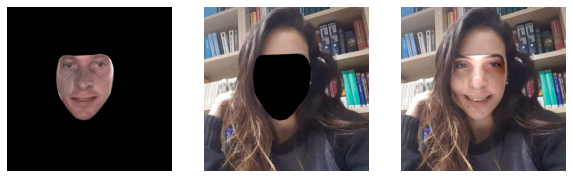

In [198]:

ex_image1 = img.copy()
ex_image2 = img2.copy()

target = np.zeros_like(ex_image1)
target2 = np.zeros_like(ex_image2, dtype=np.uint8)

for triangle in tri_indexes:
    tr_p1,tr_p2,tr_p3 = landmarks[triangle[0]], landmarks[triangle[1]], landmarks[triangle[2]]
    tr2_p1,tr2_p2,tr2_p3 = landmarks2[triangle[0]], landmarks2[triangle[1]], landmarks2[triangle[2]]

    tri_1 = np.array([tr_p1,tr_p2,tr_p3],dtype=np.int32)
    croped_tri = get_triangle_attributes(ex_image1,tri_1)

    tri_2 = np.array([tr2_p1,tr2_p2,tr2_p3],dtype=np.int32)
    croped_tri2 = get_triangle_attributes(ex_image2,tri_2)

    transform_mat = cv2.getAffineTransform(croped_tri['points'], croped_tri2['points'])
    trasformed_tri = cv2.warpAffine(croped_tri['image'], transform_mat, croped_tri2['size'])
    trasformed_tri = cv2.bitwise_and(trasformed_tri, trasformed_tri, mask=croped_tri2['mask'])

    x,y,w,h = croped_tri2['rect']
    tri_area = target2[y:y+h, x:x+w] 
    tri_area_gray = cv2.cvtColor(tri_area,cv2.COLOR_RGB2GRAY)

    _, mask_traingles_designed = cv2.threshold(tri_area_gray, 1, 255, cv2.THRESH_BINARY_INV)
    trasformed_tri = cv2.bitwise_and(trasformed_tri, trasformed_tri, mask=mask_traingles_designed)
    tri_area = cv2.add(tri_area,trasformed_tri)
    target2[y:y+h,x:x+w] = tri_area


gray_target2 = cv2.cvtColor(target2,cv2.COLOR_RGB2GRAY)
_,bg = cv2.threshold(gray_target2,0,255,cv2.THRESH_BINARY_INV)
target2 = cv2.medianBlur(target2,3)

face_mask = np.zeros_like(gray_target2)
head_mask = cv2.fillConvexPoly(face_mask, convex_hull2, 255)
face_mask = cv2.bitwise_not(head_mask)
head_noface = cv2.bitwise_and(ex_image2, ex_image2, mask=face_mask)
result = cv2.add(head_noface, target2)

(x, y, w, h) = cv2.boundingRect(convex_hull2)
center_face2 = (int((x + x + w) / 2), int((y + y + h) / 2))
seamlessclone = cv2.seamlessClone(result, ex_image2, head_mask, center_face2, cv2.MIXED_CLONE)

plt.figure(figsize=[10,4])
plt.subplot(1,3,1)
plt.axis("off")
plt.imshow(target2)

plt.subplot(1,3,2)
plt.axis("off")
plt.imshow(img2_head_noface);

plt.subplot(1,3,3)
plt.axis("off")
plt.imshow(seamlessclone);
plt.show()


# Another Example Of Swaping
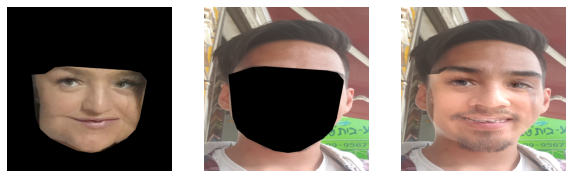

# Other Good Examples!
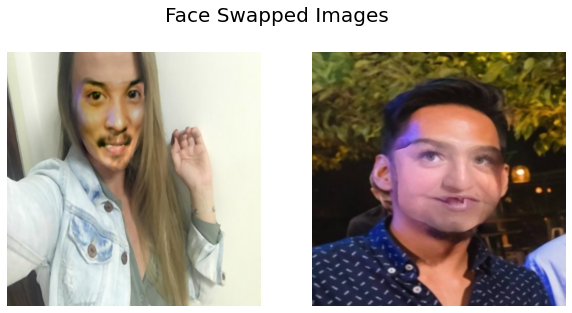
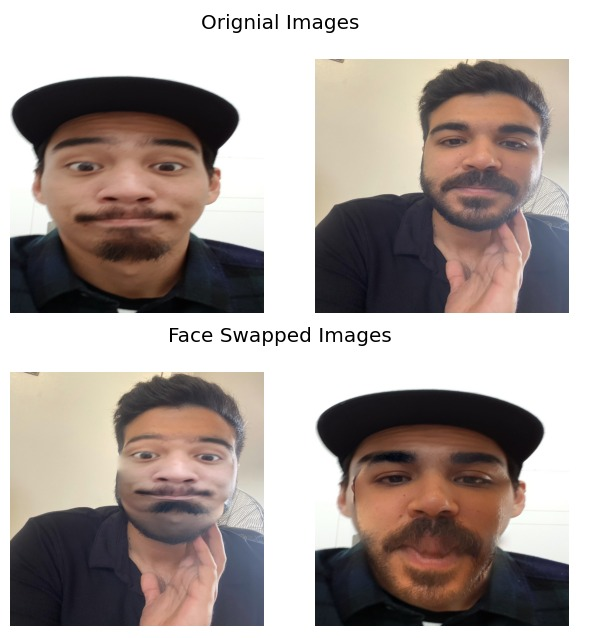
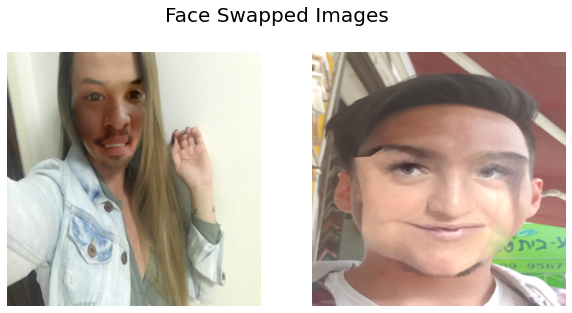

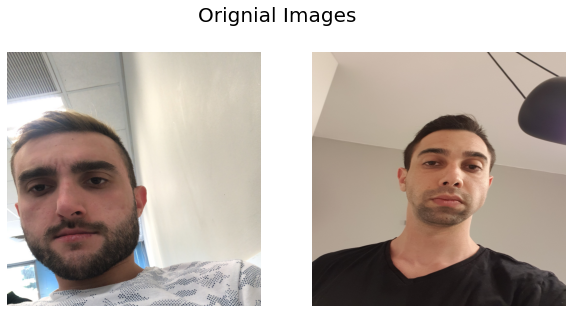
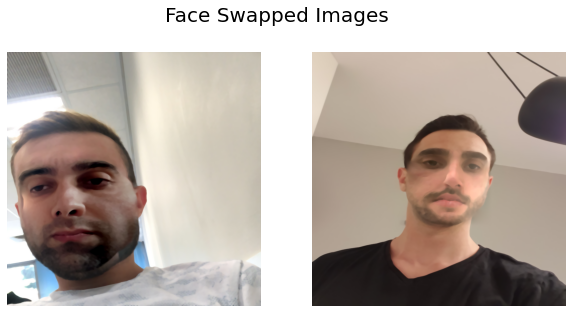

# Bad Example
Somtimes the CascadeClassifier misclassify a face on the image
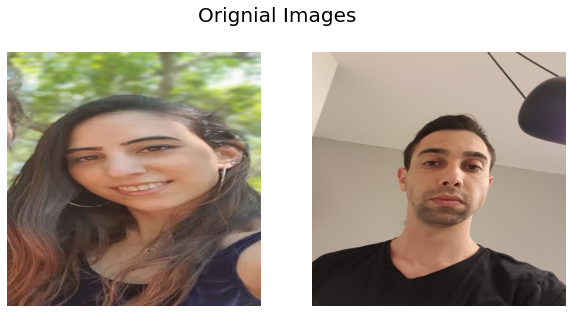
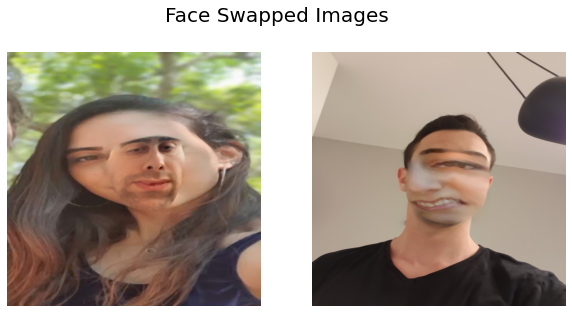